# Generate Model

In [1]:
import pandas as pd

df = pd.read_csv("../data/facial-features.csv", index_col=0)
df.head()

,feat_0,feat_1,feat_2,feat_3,feat_4,feat_5,feat_6,feat_7,feat_8,feat_9,...,feat_119,feat_120,feat_121,feat_122,feat_123,feat_124,feat_125,feat_126,feat_127,label
0,-0.132595,0.074721,0.113877,0.003933,-0.174871,0.021420,-0.023457,-0.119376,0.081392,-0.037261,...,0.038022,-0.013061,0.013142,-0.073855,-0.049392,0.167646,-0.096013,0.064757,0.111157,chandler
1,-0.180468,0.143235,0.081331,-0.040416,-0.192650,0.010953,-0.016653,-0.065922,0.129288,-0.037880,...,0.003176,-0.052909,0.059185,-0.072863,-0.085851,0.107837,-0.054400,0.094451,0.133356,chandler
2,-0.169296,0.211665,0.122778,-0.025382,-0.231406,-0.047147,-0.024301,-0.043416,0.125868,-0.007278,...,0.017425,-0.038861,0.053134,-0.042891,-0.083303,0.162920,-0.065584,0.103196,0.062724,chandler
3,-0.135426,0.122450,0.110859,-0.093162,-0.200346,-0.064251,-0.012839,-0.109234,0.130242,-0.055598,...,0.034755,0.010018,0.039088,-0.057965,-0.092471,0.142609,-0.052614,0.102054,0.137410,chandler
4,-0.137555,0.194241,0.111748,-0.055562,-0.155343,-0.020789,0.025563,-0.089853,0.127807,-0.041426,...,0.101500,-0.003403,0.041512,-0.119908,-0.090763,0.126170,0.000285,0.105272,0.092899,chandler


In [2]:
from sklearn.model_selection import train_test_split
from sklearn import preprocessing

X = df.drop(columns=['label'])
y = df.label

le = preprocessing.LabelEncoder()
y_numeric = le.fit_transform(y)
y_numeric

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y_numeric,
    test_size=0.2,
    random_state=123
)


print(X.shape,y.shape)

(174, 128) (174,)


In [3]:
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier()


# Train model

In [4]:
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

pd.DataFrame({
    "pred": le.inverse_transform(y_pred),
    "real": le.inverse_transform(y_test),
    "match": le.inverse_transform(y_pred) == le.inverse_transform(y_test)
})


,pred,real,match
0,ross,ross,True
1,joey,joey,True
2,monica,monica,True
3,phoebe,phoebe,True
4,joey,joey,True
5,joey,joey,True
6,joey,joey,True
7,rachel,rachel,True
8,joey,joey,True
9,monica,monica,True


<AxesSubplot:>

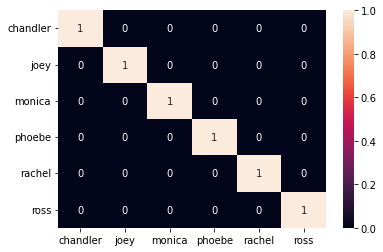

In [5]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(le.inverse_transform(y_test), le.inverse_transform(y_pred), normalize="true")
sns.heatmap(cm, annot=True,xticklabels=le.classes_, yticklabels=le.classes_,)

# Predict from image

## Get faces from image

In [6]:
from PIL import Image
import face_recognition
import matplotlib.pyplot as plt

In [7]:
def rect(top, right, bottom, left):
    return [
        [left, right, right, left, left],
        [bottom, bottom, top, top, bottom]
    ]

In [8]:
def get_faces(path):
    image = face_recognition.load_image_file(path)
    face_locations = face_recognition.face_locations(image)
    faces = []
    for i, face in enumerate(face_locations):
        top, right, bottom, left = face
        faces.append(image[top:bottom, left:right])
    return faces

In [9]:
def get_predict_features(image, is_image):
    if not is_image:
        image = face_recognition.load_image_file(path)
    face_features = face_recognition.face_encodings(image)
    df_predicted = pd.DataFrame([])
    for face_feature in face_features:
        features = {}
        for i, feat in enumerate(face_feature):
            features[f'feat_{i}'] = feat
        df_predicted = df_predicted.append([features])
    return df_predicted

In [10]:
def show_faces(path):
    faces = get_faces(path)
    plt.figure(figsize=(22,20))
    for i, face in enumerate(faces):
        plt.subplot(10, 6, i+1)
        plt.imshow(face)
        plt.axis('off')

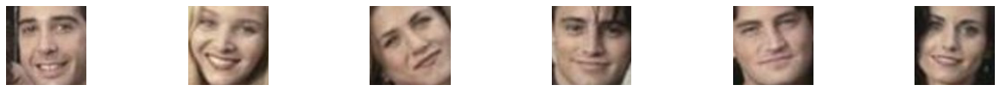

In [11]:
path = "../images/test/all.jpg"
show_faces(path)

## Make a prediction

In [12]:
def predict(path, is_image=False):
    X_predict = get_predict_features(path, is_image)
    if len(X_predict) == 0:
        return []
    y_predict = model.predict(X_predict)
    return le.inverse_transform(y_predict)

In [13]:
def show_faces_in_picture(path):
    image = face_recognition.load_image_file(path)
    face_locations = face_recognition.face_locations(image)
    face_names = predict(path)
    if len(face_names):
        plt.figure(figsize=(20, 20))
        plt.imshow(image)
        for i, face in enumerate(face_locations):
            top, right, bottom, left = face
            plt.plot(*rect(top, right, bottom, left), c="r")
            plt.text(left, bottom + 40, face_names[i], c="r", size='xx-large')

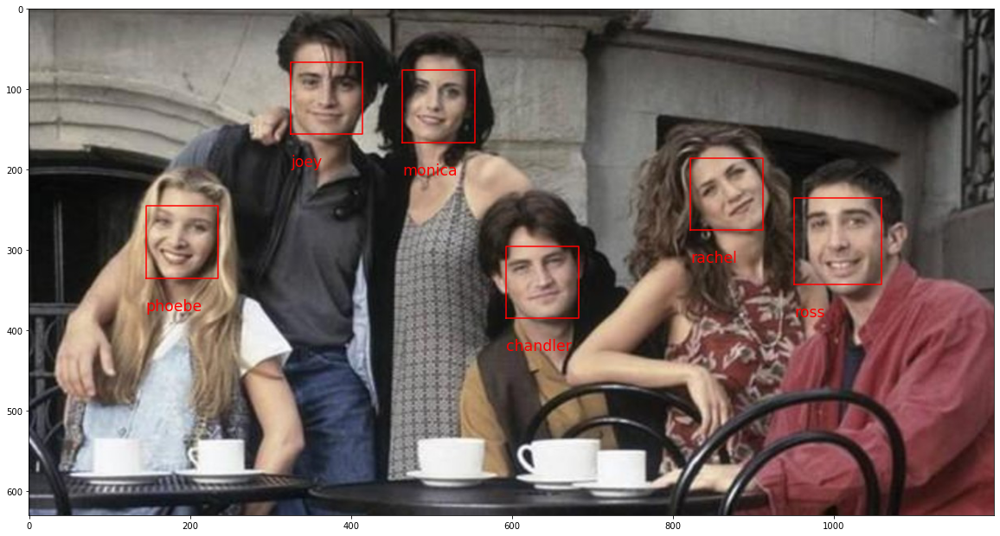

In [14]:
show_faces_in_picture(path)

## Predict from test list

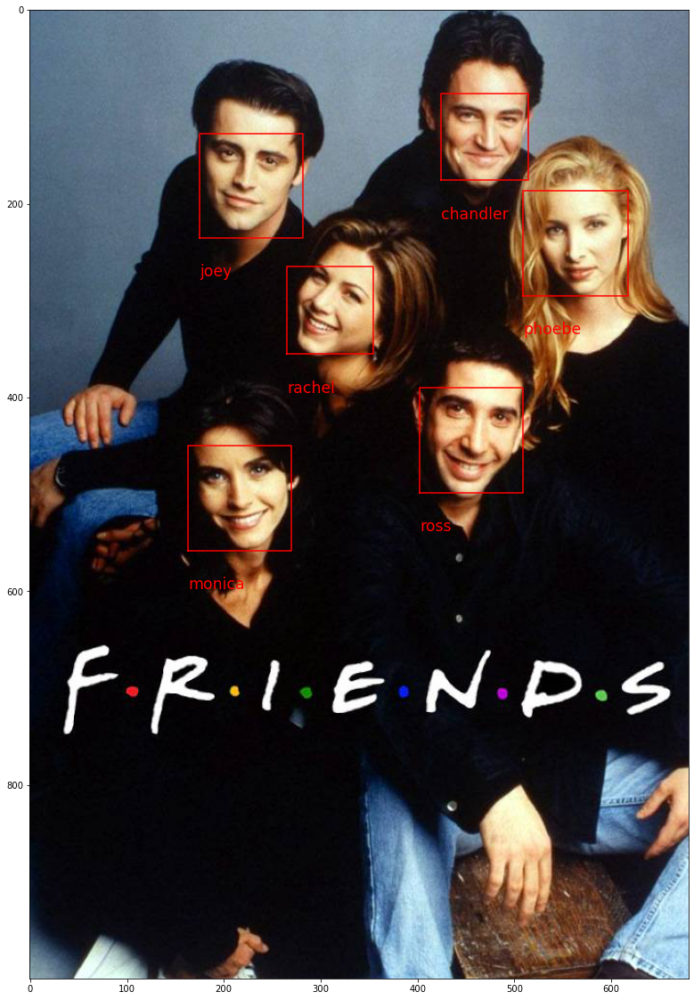

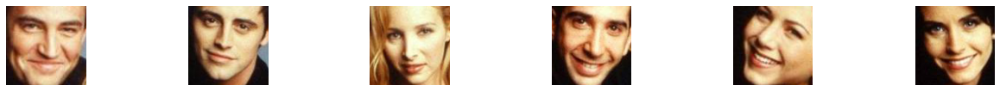

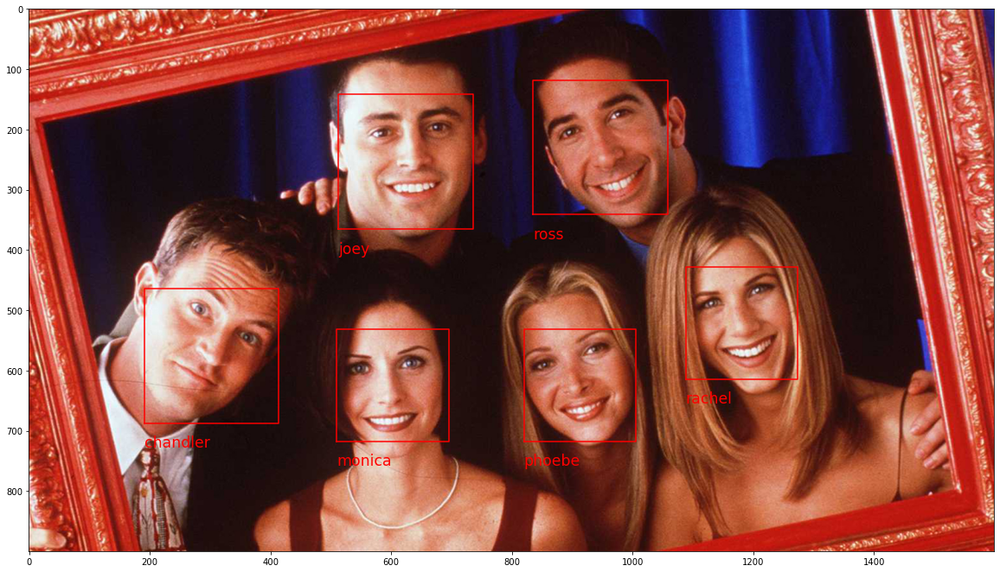

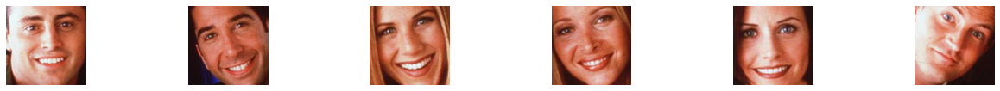

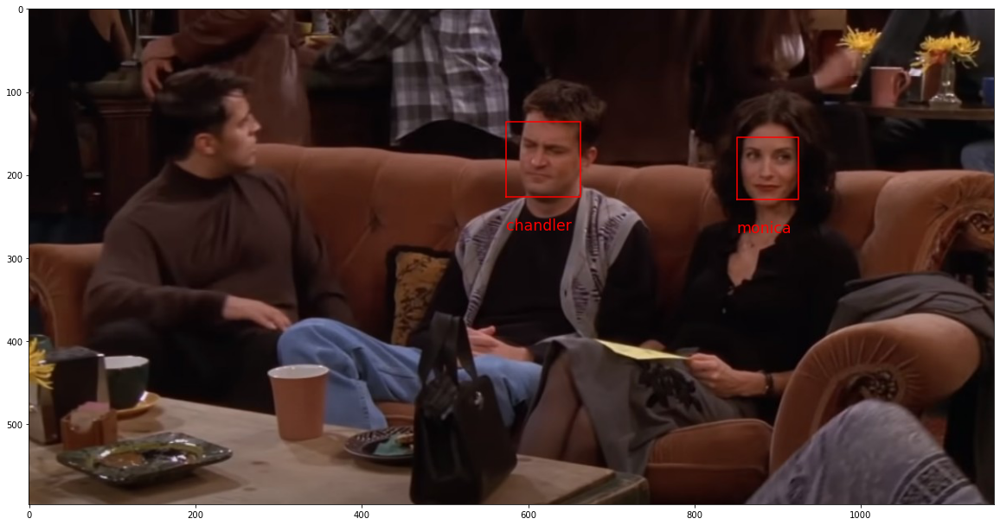

...

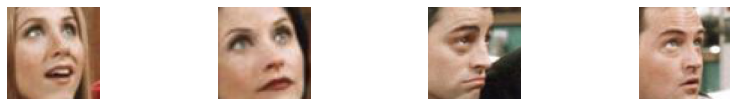

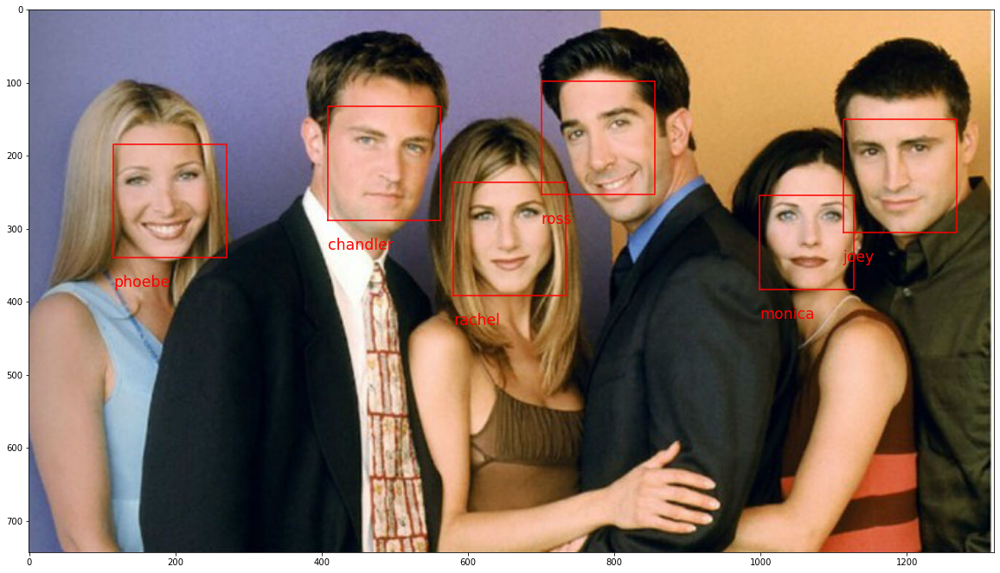

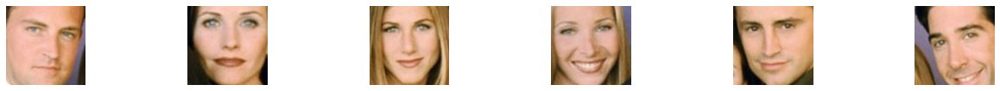

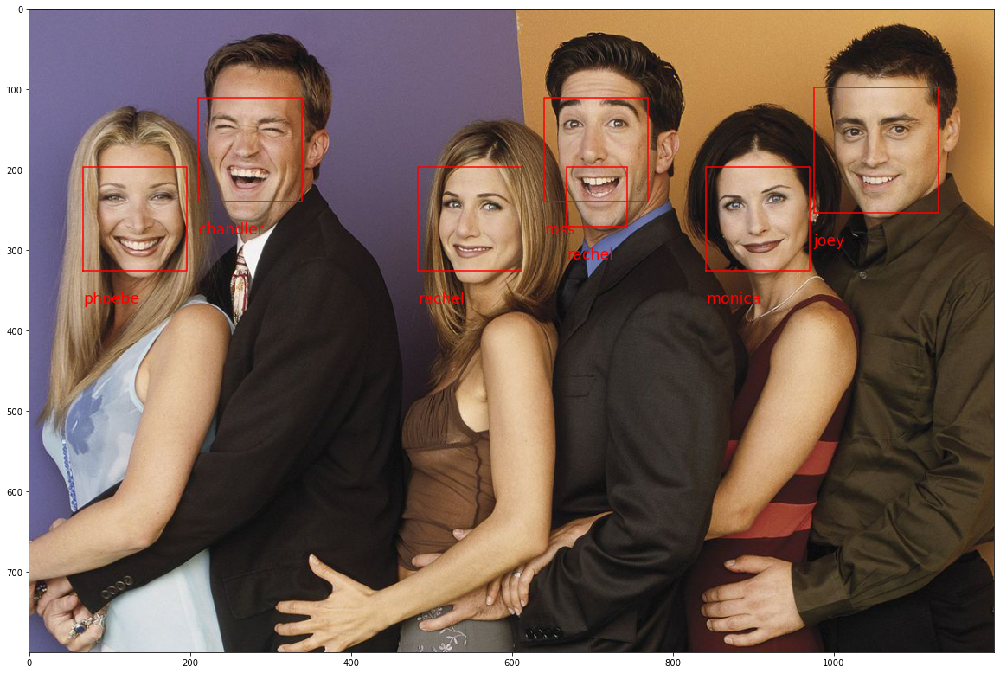

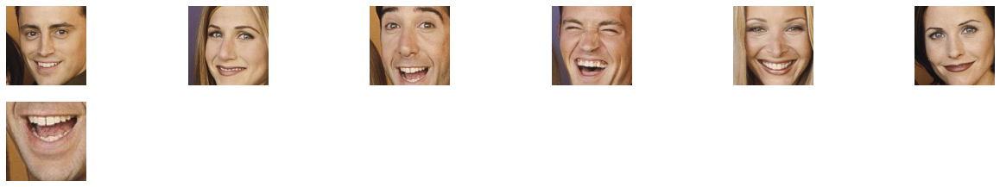

In [15]:
import os

base_path = f'../images/test/easy'
test_dir = os.listdir(base_path)

for file in test_dir:
    path = f'{base_path}/{file}'
    show_faces_in_picture(path)
    show_faces(path)


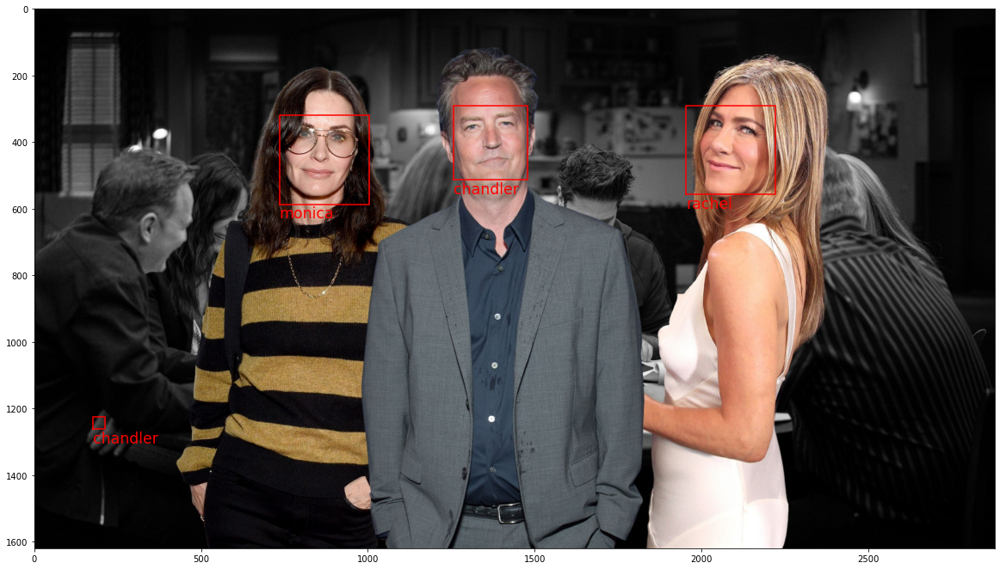

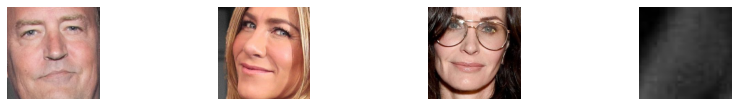

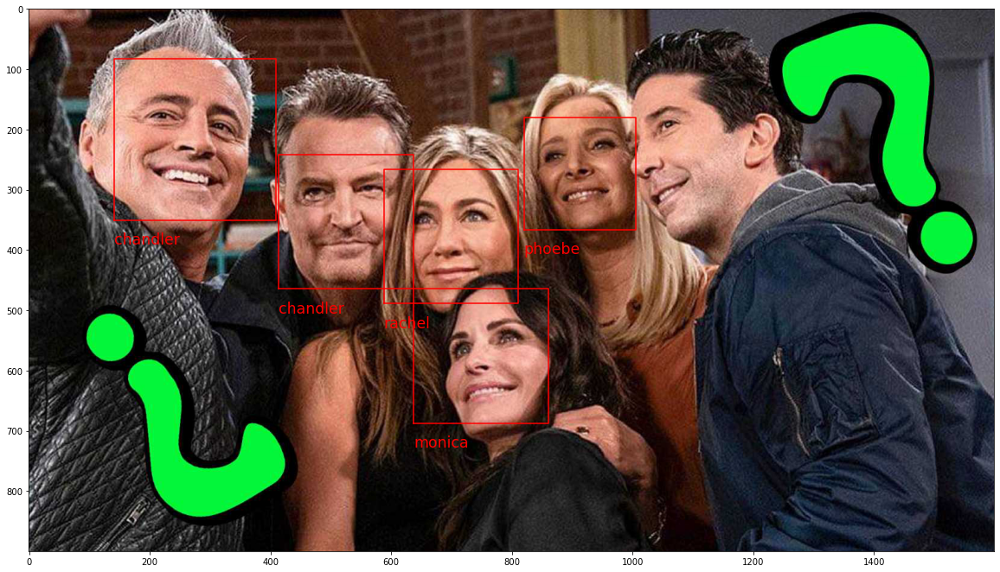

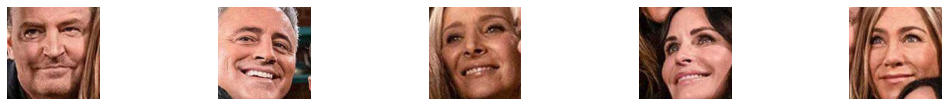

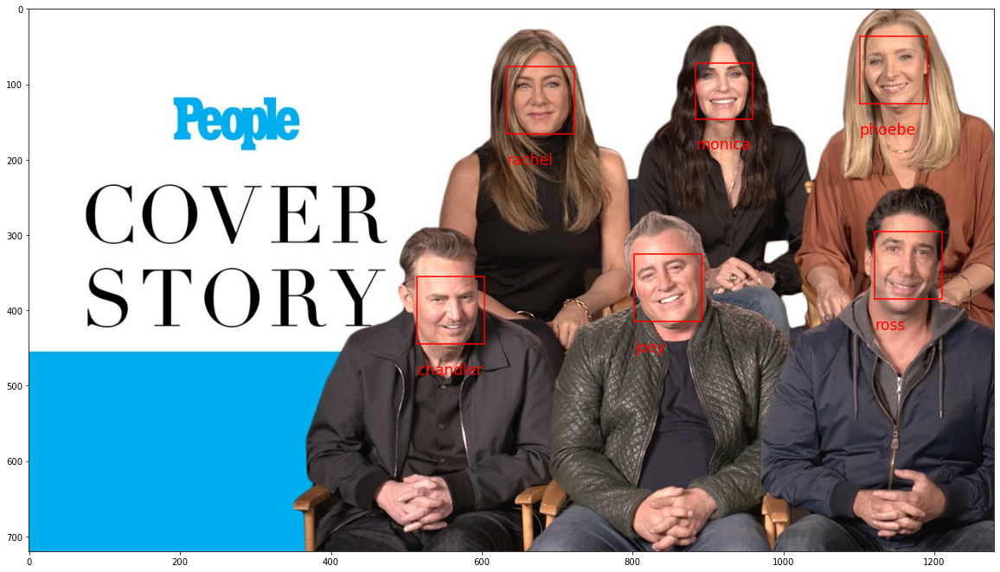

...

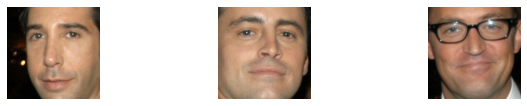

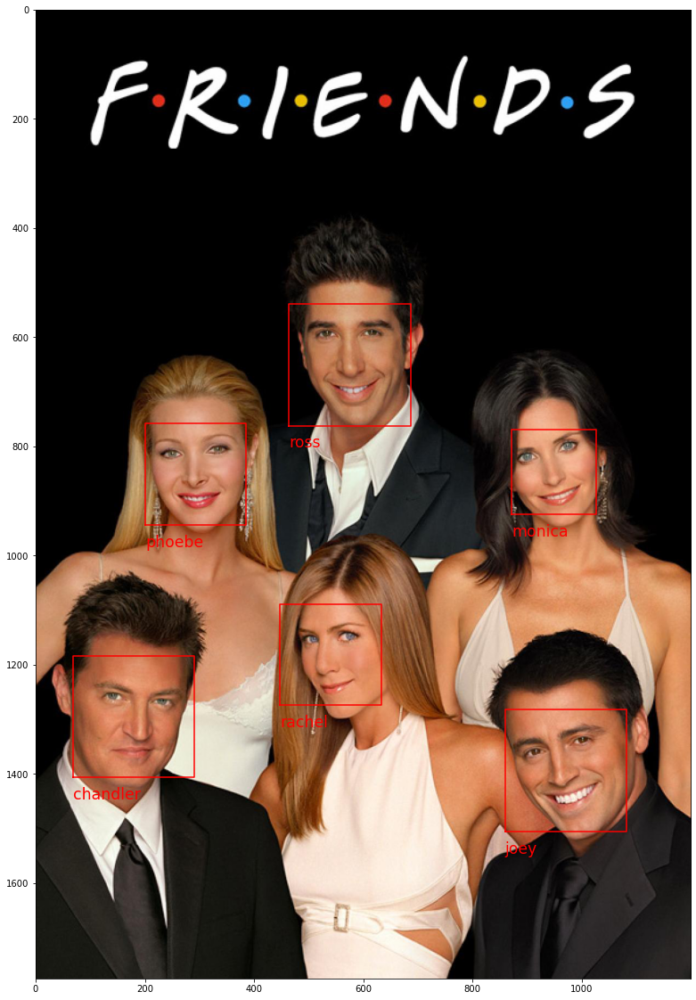

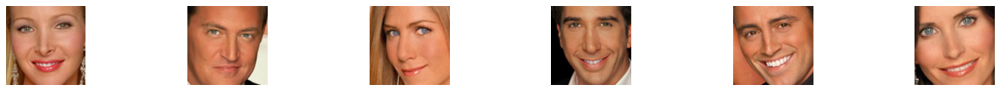

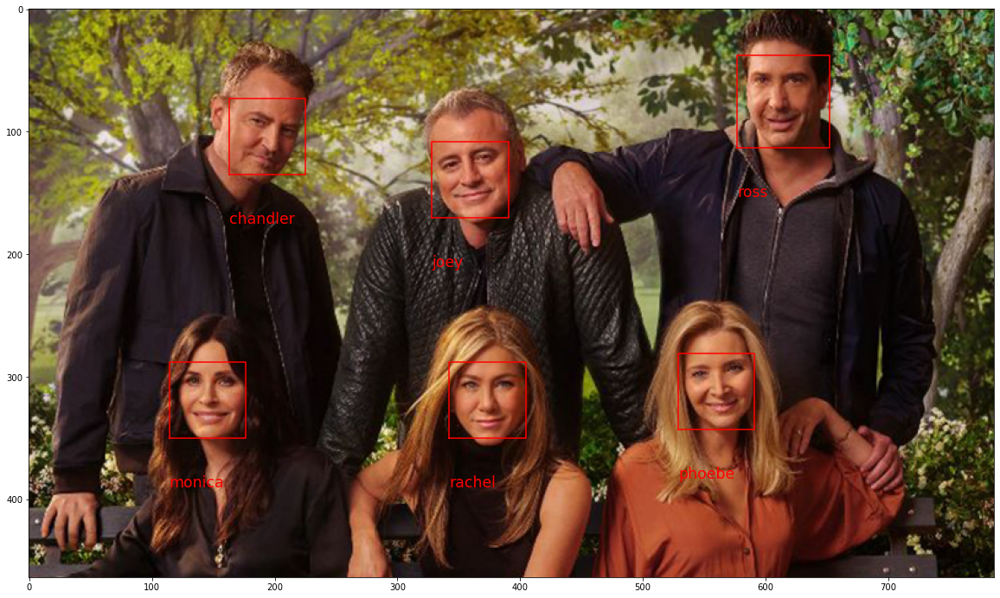

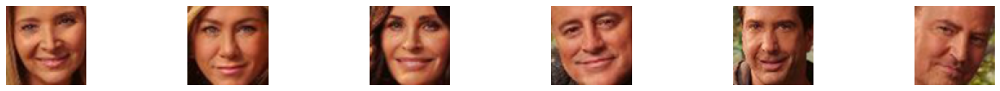

In [16]:
base_path = f'../images/test/hard'
test_dir = os.listdir(base_path)

for file in test_dir:
    path = f'{base_path}/{file}'
    show_faces_in_picture(path)
    show_faces(path)


In [ ]:
base_path = f'../images/test/heavie'
test_dir = os.listdir(base_path)

for file in test_dir:
    path = f'{base_path}/{file}'
    show_faces_in_picture(path)
    show_faces(path)


# Predict from video

In [ ]:
import numpy as np
import cv2
import imutils
import random       
from imutils.object_detection import non_max_suppression
from imutils import paths
import imutils
import cv2
import face_recognition

# function to track people
def tracker(cap):
    counter = 0
    while True:
        counter +=1
        ret, img = cap.read()
        # if counter < 4900:
        #     continue
        # if video stopped playing, quit
        if ret == False:
            break

        # resize window
        img = imutils.resize(img, width = 400)
        # detect people
        faces = face_recognition.face_locations(img)
        face_names = predict(img, True)
        for i, face in enumerate(faces):
            top, right, bottom, left = face
            # create random color
            color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
            cv2.rectangle(img, (left, top), (right, bottom), color, 1)
            if len(face_names):
                cv2.putText(img, face_names[i], (left, top), cv2.FONT_HERSHEY_SIMPLEX, .5, (255, 255, 255), 1)
        # show image
        cv2.imshow('Frame', img)

        k = cv2.waitKey(30) & 0xFF
        if k == 27:
            break
# run video
cap = cv2.VideoCapture('../video/video5.mp4')
print(cap)
tracker(cap)
# release frame and destroy windows
cap.release()
cv2.destroyAllWindows